In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/EcommerceData.csv', encoding='latin1')
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [ ]:
#Inspect the dataset
print("First 5 rows:")
print(df.head())

print("\nDataset Info:")
print(df.info())

print("\nSummary Statistics:")
print(df.describe())

print("\nColumn Names:")
print(df.columns)

First 5 rows:
  InvoiceNo StockCode                          Description  Quantity  \
0    536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1    536365     71053                  WHITE METAL LANTERN         6   
2    536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3    536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4    536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   

      InvoiceDate  UnitPrice  CustomerID         Country  
0  12/1/2010 8:26       2.55     17850.0  United Kingdom  
1  12/1/2010 8:26       3.39     17850.0  United Kingdom  
2  12/1/2010 8:26       2.75     17850.0  United Kingdom  
3  12/1/2010 8:26       3.39     17850.0  United Kingdom  
4  12/1/2010 8:26       3.39     17850.0  United Kingdom  

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       -------------

# **Data Preparation**

In [ ]:
#find missing counts
missing_counts = df.isna().sum()

print("Missing values per column:")
print(missing_counts)

Missing values per column:
InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64


In [ ]:
print("\nMissing values before cleaning:")
print(df.isna().sum())

#fill missing CustomerID
df["CustomerID"] = df["CustomerID"].fillna("Unknown")

#fill missing descriptions
df["Description"] = df["Description"].astype(str).str.strip()
df["Description"] = df["Description"].replace("", "Unknown")

print("\nMissing values after cleaning:")
print(df.isna().sum())


Missing values before cleaning:
InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

Missing values after cleaning:
InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64


# Replacing Rather Than Removing

After viewing just how many missing CustomerID values there were, I decided to go the route of filling the missing values rather than just removing them, which is what I typically would do. Most of the required analysis in this project does not require an explicit need for the CustomerIDs, but does heavily require the information associated with them. Removing that many rows would contribute to a huge loss of data needed to form a meaningful insight. The same thought process influenced the decision to fill the description column as well, as I am not actually explicitly exploring that column, I just want to keep the rows for better insight.

In [ ]:
#Remove negative or 0 quantities
if 'Quantity' in df.columns:
    df = df[df['Quantity'] > 0]

#Remove negative or 0 prices
if 'UnitPrice' in df.columns:
    df = df[df['UnitPrice'] > 0]

#Remove cancelled invoices (usually start with 'C')
if 'InvoiceNo' in df.columns:
    df = df[~df['InvoiceNo'].astype(str).str.startswith('C')]

#Remove Duplicate Records
before_duplicates = df.shape[0]
df = df.drop_duplicates()
after_duplicates = df.shape[0]

print(f"\nDuplicates removed: {before_duplicates - after_duplicates}")

#Convert InvoiceDate to datetime
if 'InvoiceDate' in df.columns:
    df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], errors='coerce')

print("\nFinal Data Types:")
print(df.dtypes)


Duplicates removed: 5226

Final Data Types:
InvoiceNo              object
StockCode              object
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID             object
Country                object
dtype: object


# Removals

Negative or 0 quantities indicated returns or cancellations, which therefore did not contribute to revenue or sales volume.

A valid transaction would have to include a price. UnitPrice values that were 0 or less were removed since they could indicate refunds or returns, and did not contribute to overall metrics.

Cancelled orders had a specific invoice that started with a "C", while valid orders all started with a 5. They were removed since they do not contribute to actual revenue.

Duplicate records could artifically inflate metrics for analysis, like revenue, or sales volume. Removing them ensures analysis accuracy.

Converting InvoiceDate to date time allows for easier analysis by removing the need to dissect each object value. A preset uniform value makes the column easier to analyze.  



In [ ]:
print("\nCleaned Dataset Shape:", df.shape)
print("\nPreview Cleaned Data:")
print(df.head())


Cleaned Dataset Shape: (524878, 8)

Preview Cleaned Data:
  InvoiceNo StockCode                          Description  Quantity  \
0    536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1    536365     71053                  WHITE METAL LANTERN         6   
2    536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3    536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4    536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   

          InvoiceDate  UnitPrice CustomerID         Country  
0 2010-12-01 08:26:00       2.55    17850.0  United Kingdom  
1 2010-12-01 08:26:00       3.39    17850.0  United Kingdom  
2 2010-12-01 08:26:00       2.75    17850.0  United Kingdom  
3 2010-12-01 08:26:00       3.39    17850.0  United Kingdom  
4 2010-12-01 08:26:00       3.39    17850.0  United Kingdom  


# Clean Dataset

The dataset now looks complete and uniform.

# **Feature Engineering**

In [ ]:
#create totalprice column
df['TotalPrice'] = df['Quantity'] * df['UnitPrice']

#extract time based features

#hour
df['Hour'] = df['InvoiceDate'].dt.hour

#day of week
df['DayOfWeek'] = df['InvoiceDate'].dt.day_name()

#month
df['Month'] = df['InvoiceDate'].dt.month_name()

print(df[['InvoiceDate', 'TotalPrice', 'Hour', 'DayOfWeek', 'Month']].head())

          InvoiceDate  TotalPrice  Hour  DayOfWeek     Month
0 2010-12-01 08:26:00       15.30     8  Wednesday  December
1 2010-12-01 08:26:00       20.34     8  Wednesday  December
2 2010-12-01 08:26:00       22.00     8  Wednesday  December
3 2010-12-01 08:26:00       20.34     8  Wednesday  December
4 2010-12-01 08:26:00       20.34     8  Wednesday  December


# Why New Features?

These new variables were established to allow deeper analysis of sales behavior. They create new areas for exploration and visualization.

# **EDA**

In [ ]:
#key metrics

#total number of customers
total_customers = df['CustomerID'].nunique()

#total number of transactions
total_transactions = df['InvoiceNo'].nunique()

#total revenue
total_revenue = df['TotalPrice'].sum()

#average order value
avg_order_value = total_revenue / total_transactions

print("Total Customers:", total_customers)
print("Total Transactions:", total_transactions)
print("Total Revenue:", round(total_revenue, 2))
print("Average Order Value:", round(avg_order_value, 2))

Total Customers: 4339
Total Transactions: 19960
Total Revenue: 10642110.8
Average Order Value: 533.17


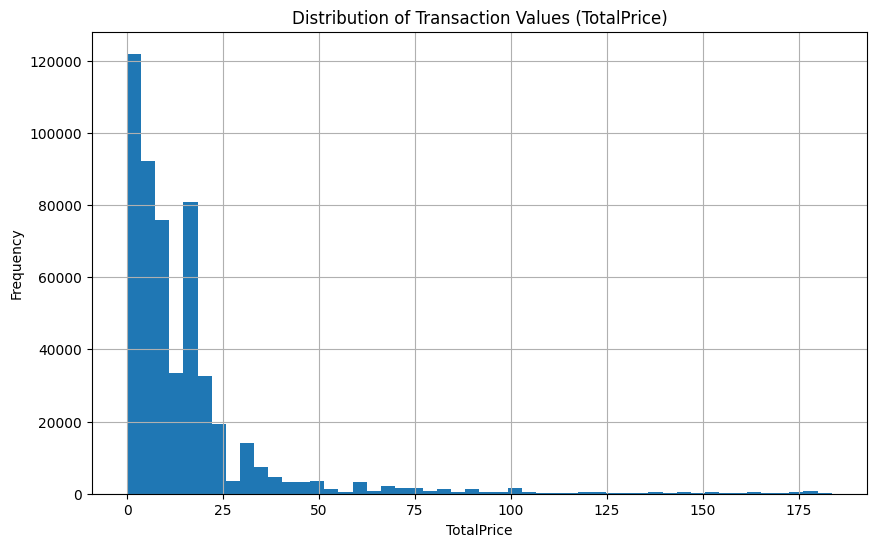

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

#remove extreme outliers for better visualization
filtered = df[df["TotalPrice"] < df["TotalPrice"].quantile(0.99)]

plt.hist(filtered["TotalPrice"], bins=50)
plt.title("Distribution of Transaction Values (TotalPrice)")
plt.xlabel("TotalPrice")
plt.ylabel("Frequency")
plt.grid()

plt.show()

# Histogram of Total Price

My histogram originally appeared as only 1 singular column. To create a better visual insight, I removed extreme outliers and excluded the top 1% to better view the right skewed distribution. This shows that the overwhelming majority of transactions were very small, typically less than $25.

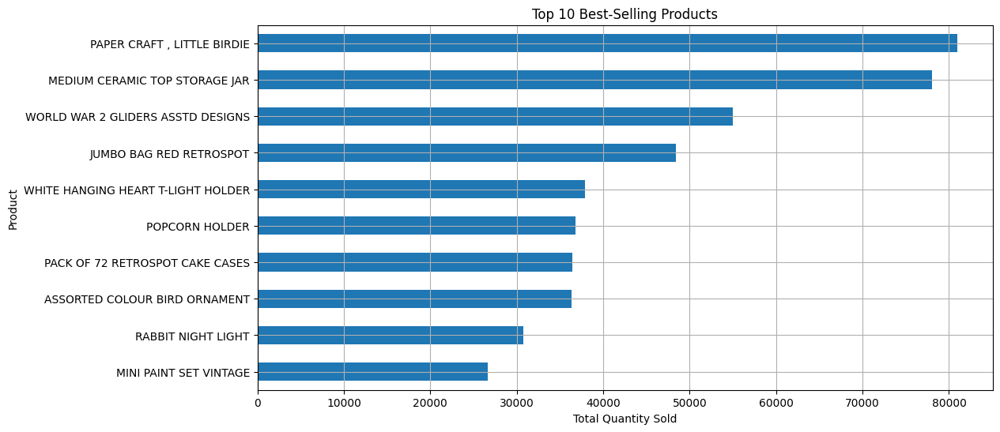

In [ ]:
#top 10 best selling products
df_plot = df[df["Description"] != "Unknown"]

top_products = (
    df_plot.groupby("Description")["Quantity"]
    .sum()
    .sort_values(ascending=False)
    .head(10)
)

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
top_products.sort_values().plot(kind="barh")

plt.title("Top 10 Best-Selling Products")
plt.xlabel("Total Quantity Sold")
plt.ylabel("Product")
plt.grid()

plt.show()

#Top 10 Best Selling Products

The top 10 best selling products are as depicted by the horizontal bar chart, led by "Paper craft, little birdie". My bar chart originally included the the rows with the "unknown" description types as their own categories with very high metrics. Since the "unknown" description category could contain several different products, I included code to exclude them from the visualization.

# **Advanced** **Viusalizations**

In [ ]:
import plotly.express as px

heatmap_data = df.pivot_table(
    values="Quantity",
    index="DayOfWeek",
    columns="Hour",
    aggfunc="sum"
).fillna(0)

fig = px.imshow(
    heatmap_data,
    labels=dict(x="Hour of Day", y="Day of Week", color="Quantity Sold"),
    title="Sales Volume by Hour and Day of Week",
    aspect="auto",
    color_continuous_scale="Cividis"
)

fig.show()

# Sales Volume per Hour and Day of Week

Sales volume reaches its overall peak on Tuesday at the 10th hour of the day (10:00 AM) with a quantity sold of 208.33k.

In [ ]:
top_countries = (
    df["Country"]
    .value_counts()
    .head(10)
    .index
)

df_plot = df[df["Country"].isin(top_countries)]

df_plot = df_plot[df_plot["TotalPrice"] < df_plot["TotalPrice"].quantile(0.99)]

fig = px.box(
    df_plot,
    x="Country",
    y="TotalPrice",
    title="Distribution of Order Values by Country",
    points="outliers"  # show extreme values
)

fig.update_layout(
    xaxis_title="Country",
    yaxis_title="Order Value",
    xaxis_tickangle=45
)

fig.show()



# Distributions of Order Values by Country

The boxplot compares distributions of order values between the top 10 countries. I measured it excluding the top 1% quartile in order to prevent extremely small distributions, which was what my initial graph was showing. We can observe that the Netherlands and Australia had significant variability in their spending, indicated by their wide boxplot showcasing large interquartile ranges. These countries had great diversity in customer behavior, whereas most countries saw their purchases fall into at most a $20 range.

# **Geospatial Analysis**

In [ ]:
#count number of invoices per country
invoice_counts = (
    df.groupby("Country")["InvoiceNo"]
    .nunique()
    .reset_index(name="invoice_count")
)

invoice_counts.head()

,Country,invoice_count
0,Australia,57
1,Austria,17
2,Bahrain,3
3,Belgium,98
4,Brazil,1


In [ ]:
import geopandas as gpd

url = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)

print(world.head())

        featurecla  scalerank  LABELRANK                   SOVEREIGNT SOV_A3  \
0  Admin-0 country          1          6                         Fiji    FJI   
1  Admin-0 country          1          3  United Republic of Tanzania    TZA   
2  Admin-0 country          1          7               Western Sahara    SAH   
3  Admin-0 country          1          2                       Canada    CAN   
4  Admin-0 country          1          2     United States of America    US1   

   ADM0_DIF  LEVEL               TYPE TLC                        ADMIN  ...  \
0         0      2  Sovereign country   1                         Fiji  ...   
1         0      2  Sovereign country   1  United Republic of Tanzania  ...   
2         0      2      Indeterminate   1               Western Sahara  ...   
3         0      2  Sovereign country   1                       Canada  ...   
4         1      2            Country   1     United States of America  ...   

      FCLASS_TR     FCLASS_ID     FCLASS_PL 

 # Getting GeoPandas to Work

 I originally experienced some issues getting GeoPandas to configurate properly. Gemini informed me that GeoPandas >1 was removed, so my original code of "world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))" was not able to operate. It solved this by directly linking the Natural Earth countries dataset via URL.                                                         

In [ ]:
invoice_counts["Country_clean"] = invoice_counts["Country"].str.strip().str.lower()
world["name_clean"] = world["NAME"].str.strip().str.lower()

In [ ]:
country_mapping = {
    "eire": "ireland",
    "usa": "united states of america",
    "united states": "united states of america",
    "rsa": "south africa",
    "czech republic": "czechia",
    "channel islands": "united kingdom"
}

invoice_counts["Country_clean"] = invoice_counts["Country_clean"].replace(country_mapping)

In [ ]:
plt.figure(figsize=(15,10))

geo_df = world.merge(
    invoice_counts,
    left_on="name_clean",
    right_on="Country_clean",
    how="left"
)

geo_df["invoice_count"] = geo_df["invoice_count"].fillna(0)

<Figure size 1500x1000 with 0 Axes>

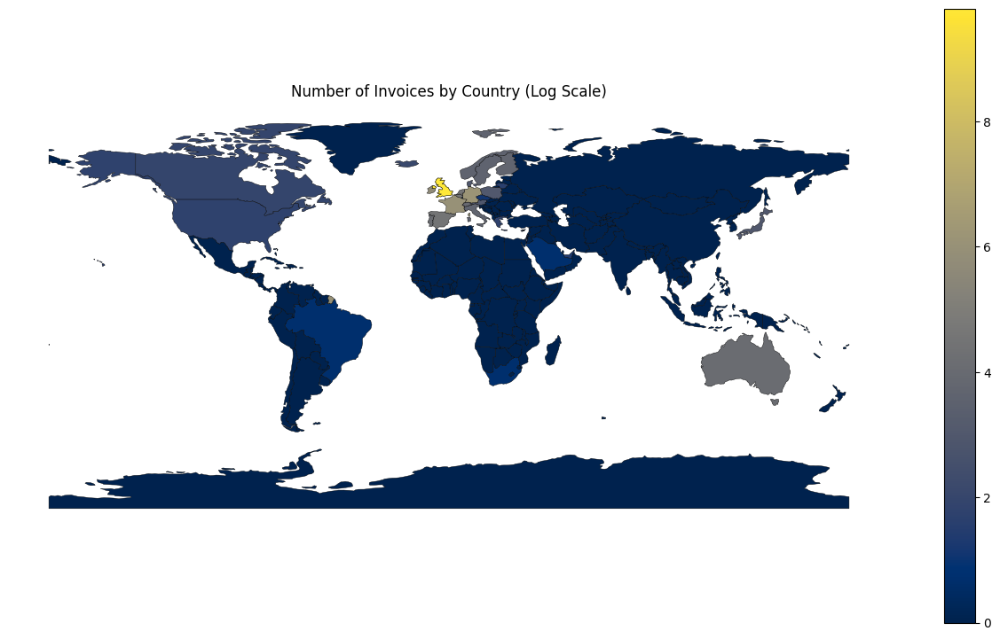

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

geo_df["log_invoice_count"] = np.log1p(geo_df["invoice_count"])

fig, ax = plt.subplots(figsize=(16, 9))

geo_df.plot(
    column="log_invoice_count",
    cmap="cividis",
    legend=True,
    edgecolor="black",
    linewidth=0.3,
    ax=ax
)

ax.set_title("Number of Invoices by Country (Log Scale)")
ax.axis("off")

plt.show()

# Geographic Trends

The UK dominated the highest concentration of invoice activity. I had to introduce a logarithmic scale in order to allow visibility of other countries because my original world map did not produce much insight visually. The log scale allowed for visualization of other countries with much smaller invoice volumes to be visible for comparison.

# **Dashboard Exploration**

The following code blocks are purely for mockup dashboard visualizations.

# Sales Dashboard

In [ ]:
#total revenue
total_revenue = df["TotalPrice"].sum()

print("Total Revenue: $", round(total_revenue, 2))

Total Revenue: $ 10642110.8


In [ ]:
total_transactions = df["InvoiceNo"].nunique()

print("Total Transactions:", total_transactions)

Total Transactions: 19960


In [ ]:
average_order_value = total_revenue / total_transactions

print("Average Order Value: $", round(average_order_value, 2))

Average Order Value: $ 533.17


In [ ]:
total_quantity_sold = df["Quantity"].sum()

print("Total Quantity Sold:", total_quantity_sold)

Total Quantity Sold: 5572420


# Geographic Dashboard

In [ ]:
#total number of customers
df["CustomerID"].nunique()

4339

In [ ]:
#top country by revenue
df.groupby("Country")["TotalPrice"].sum().idxmax()

'United Kingdom'

In [ ]:
#revenue by top country
country_revenue = df.groupby("Country")["TotalPrice"].sum()
top_pct = country_revenue.max() / country_revenue.sum() * 100
print("Revenue from Top Country (%):", round(top_pct, 2))

Revenue from Top Country (%): 84.59


In [ ]:
#average order value by country
df[df["Country"] == "United Kingdom"]["TotalPrice"].mean()

np.float64(18.754219598529122)

In [ ]:
df['YearMonth'] = df['InvoiceDate'].dt.to_period('M')

monthly_revenue = (
    df.groupby("YearMonth")["TotalPrice"]
    .sum()
    .reset_index()
)

# Convert YearMonth to string for Plotly compatibility
monthly_revenue['YearMonth'] = monthly_revenue['YearMonth'].astype(str)

# Plot
fig = px.line(
    monthly_revenue,
    x="YearMonth",
    y="TotalPrice",
    title="Revenue Over Time (Monthly)",
    markers=True
)

fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Revenue"
)

fig.show()